## Estimating the initial wavefield

This notebook plots the (logarithm of the) amplitude of the complex-valued delay-Doppler wavefield estimate derived from each spin harmonic of the time-frequency cyclic spectra, then chooses the harmonic that produces the wavefield with the highest signal-to-noise ratio.

In [6]:
import numpy as np
from scipy.fft import fft, fftshift, ifft, irfft, rfft
import psrchive
import pycyc
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.ticker import MultipleLocator
import matplotlib as mpl
from plotting import plot_intrinsic_vs_observed
import copy
import pickle
import importlib
import sys
import time
import glob

mpl.rcParams["image.aspect"] = "auto"

### Load cyclic spectra

Load one file, pscrunch, zap edges, and transform periodic spectra to cyclic spectra.

In [7]:
zap_edges = 0.05556
count = 0
for filename in glob.glob("P2067/*.pb2"):
    print (f"loading {filename}")

    ar = psrchive.Archive_load(filename)
    data = ar.get_data()
    ar.pscrunch()

    nsub, npol, nchan, nbin = data.shape
    
    zap_count = int(zap_edges * nchan)
    
    # eliminate the polarization dimension and zap edges
    data = data[:, 0, zap_count:-zap_count, :]

    nsub, nchan, nbin = data.shape

    cs = pycyc.ps2cs(data,axis=2)
    nsub, nchan, nharm = cs.shape

    print (f"nsubint={nsub} nchan={nchan} nharm={nharm}")

loading P2067/2006-05-18-08:05:00.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:12:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:45:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:39:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:19:00.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:06:00.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:50:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:44:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:04:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:03:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:15:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:26:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:31:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:09:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:24:00.

nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:21:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:01:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:33:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:59:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:48:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:37:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:20:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:22:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-08:18:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:54:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:53:15.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:49:30.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:56:45.pb2
nsubint=1 nchan=4096 nharm=257
loading P2067/2006-05-18-07:49:00.pb2
nsubint=1 nchan=4096 nharm=257
loa

### Transform from time-frequency to delay-Doppler

In [3]:
h = pycyc.time2freq(pycyc.freq2time(cs,axis=1),axis=0)
data = None
cs = None

### Plot the delay-doppler wavefield estimate for the first 20 spin harmonics

Also compute and store the signal-to-noise ratio (S/N) for each harmonic.

harmonic=0
harmonic=0 rms=14266.634765625 log10(rms)=4.154321670532227 S/N=1.6719810962677002


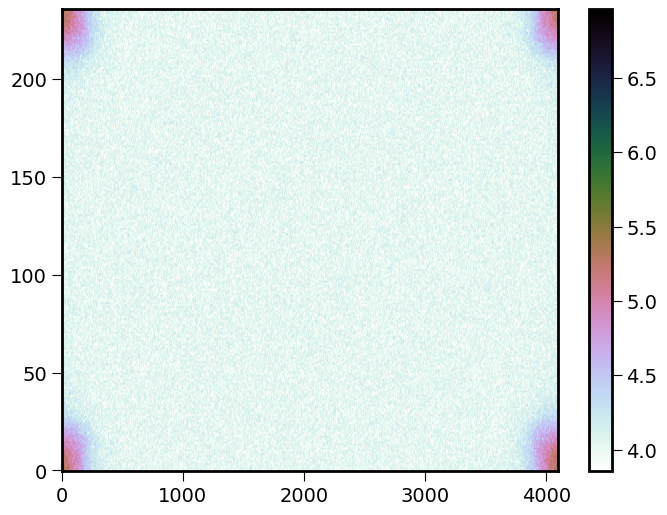

harmonic=1
harmonic=1 rms=1798.3065185546875 log10(rms)=3.254863739013672 S/N=1.3706382513046265


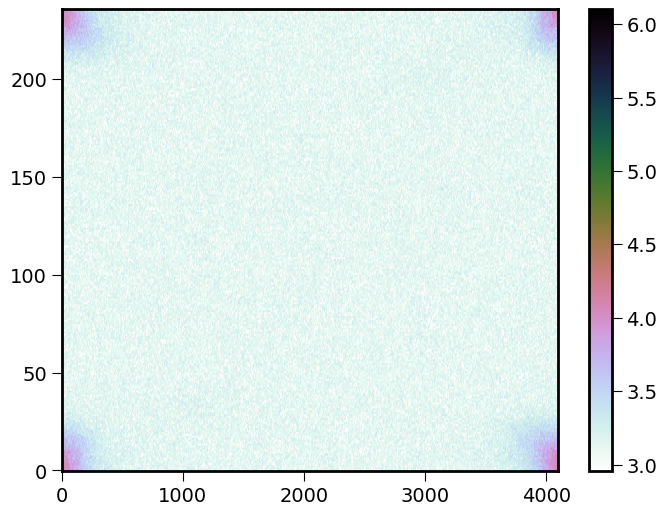

harmonic=2
harmonic=2 rms=1824.1634521484375 log10(rms)=3.261063814163208 S/N=3.646226644515991


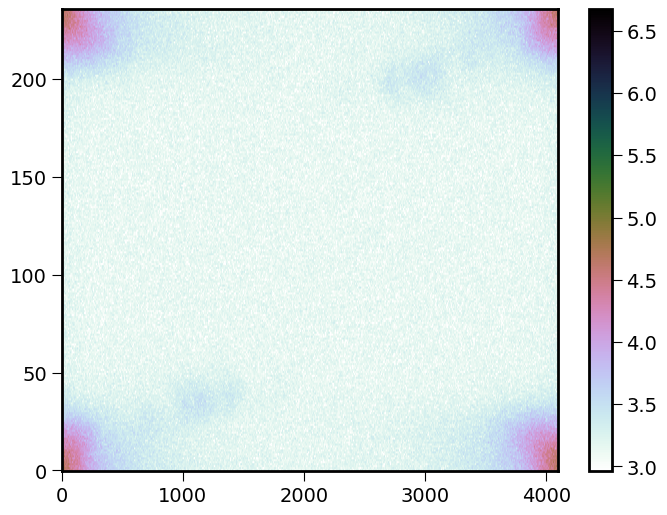

harmonic=3
harmonic=3 rms=1793.2142333984375 log10(rms)=3.253632068634033 S/N=1.4624308347702026


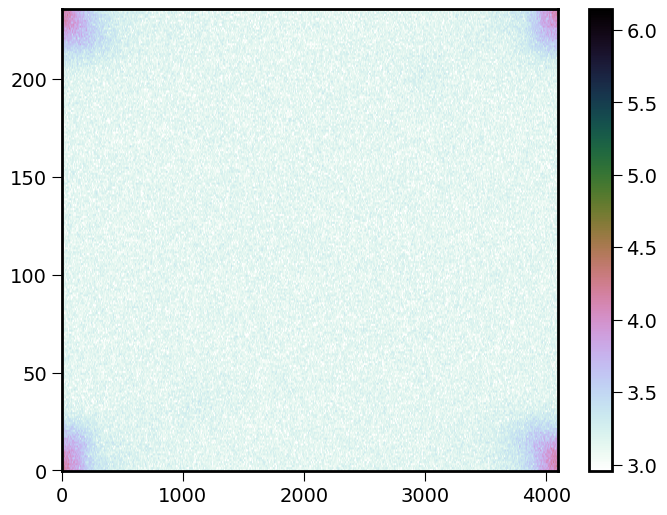

harmonic=4
harmonic=4 rms=1812.1800537109375 log10(rms)=3.2582013607025146 S/N=3.3587424755096436


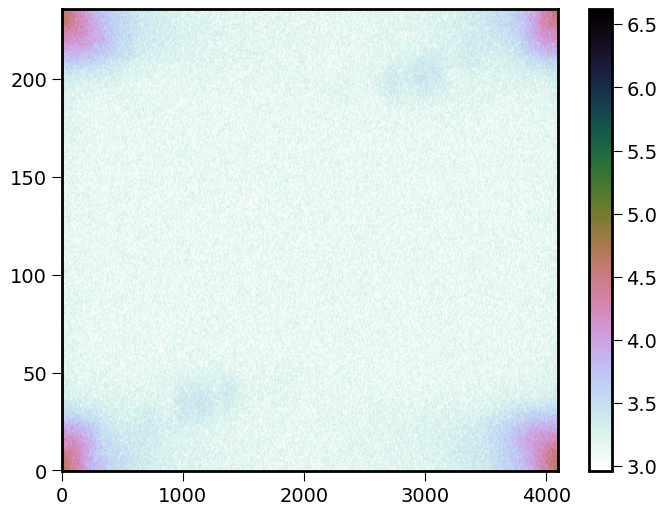

harmonic=5
harmonic=5 rms=1795.600830078125 log10(rms)=3.2542097568511963 S/N=1.5586960315704346


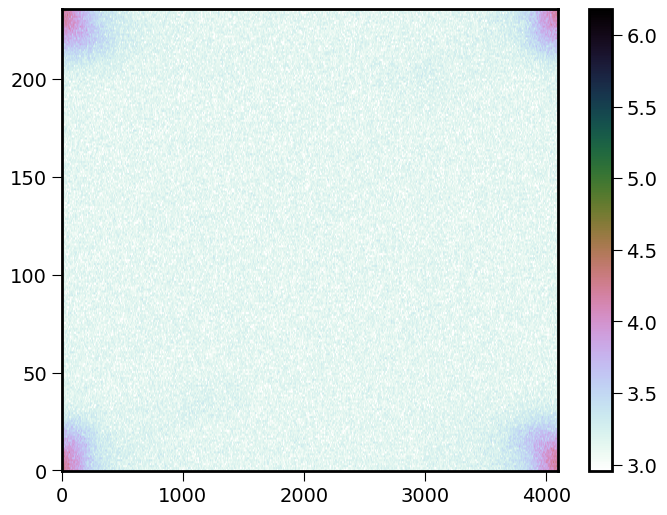

harmonic=6
harmonic=6 rms=1805.88427734375 log10(rms)=3.25669002532959 S/N=2.970965623855591


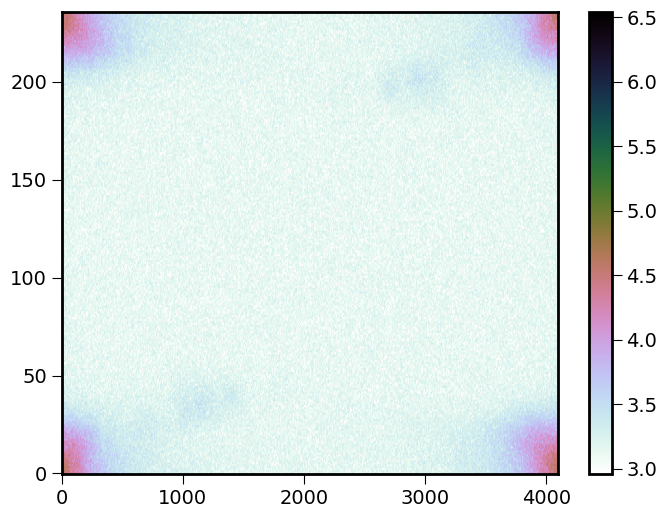

harmonic=7
harmonic=7 rms=1793.499755859375 log10(rms)=3.2537012100219727 S/N=1.64073646068573


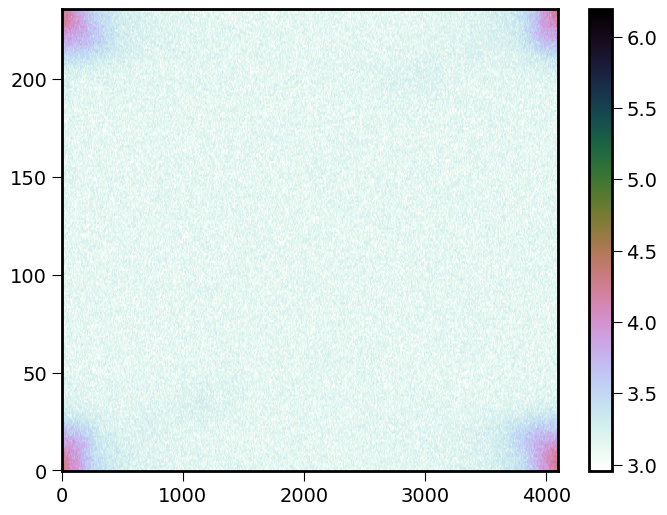

harmonic=8
harmonic=8 rms=1809.2025146484375 log10(rms)=3.2574872970581055 S/N=2.554445266723633


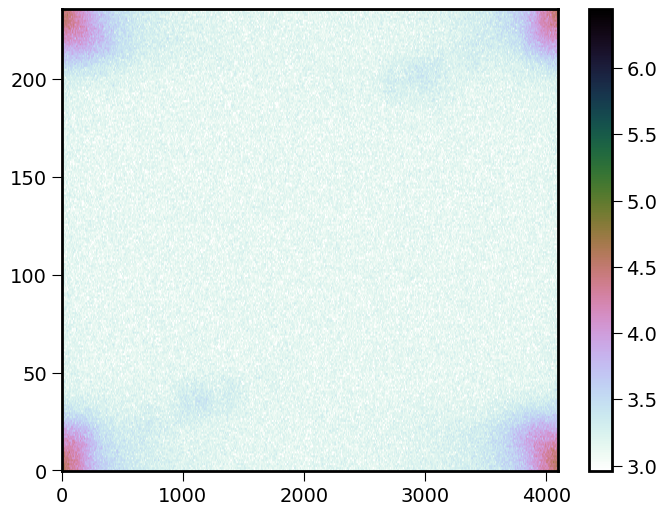

harmonic=9
harmonic=9 rms=1789.1729736328125 log10(rms)=3.252652406692505 S/N=1.6728425025939941


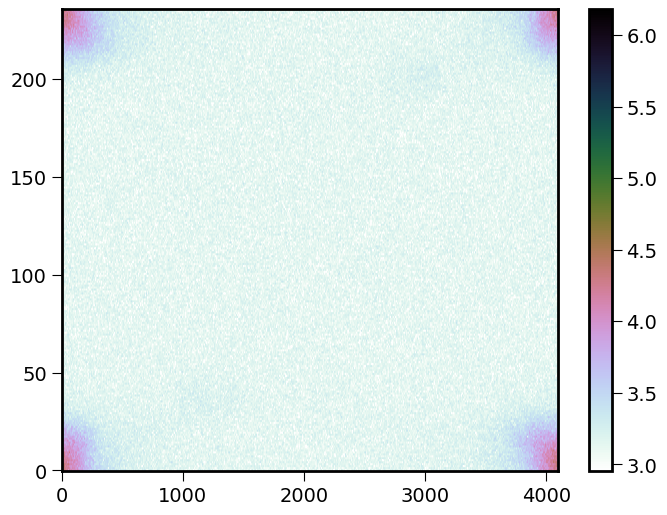

harmonic=10
harmonic=10 rms=1808.6151123046875 log10(rms)=3.2573461532592773 S/N=2.163390636444092


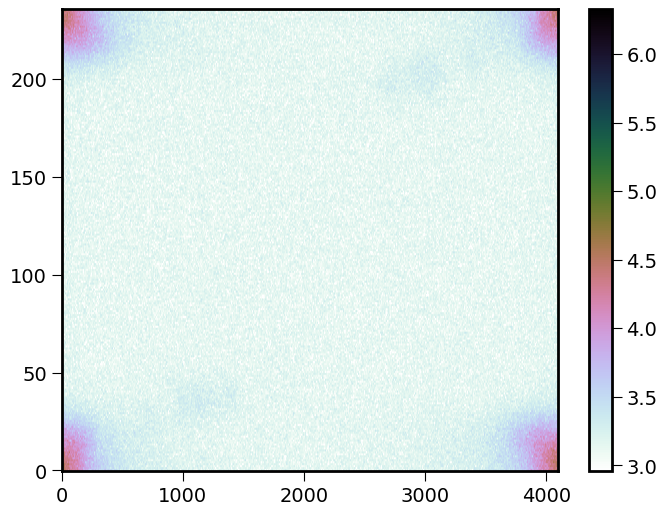

harmonic=11
harmonic=11 rms=1799.3258056640625 log10(rms)=3.2551097869873047 S/N=1.6323974132537842


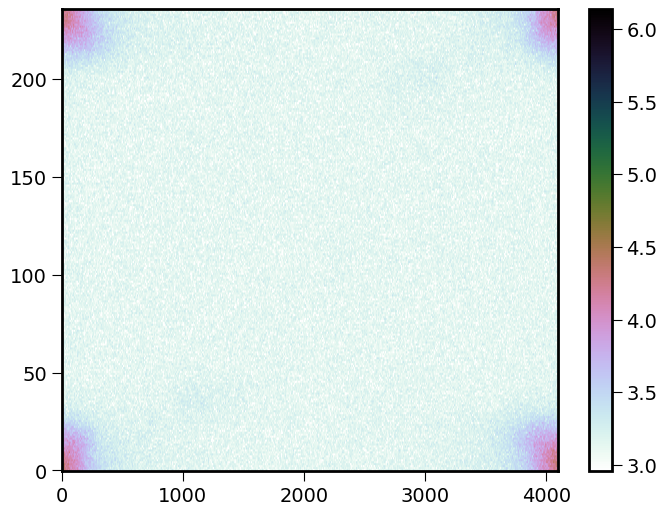

harmonic=12
harmonic=12 rms=1809.3450927734375 log10(rms)=3.257521390914917 S/N=1.8030802011489868


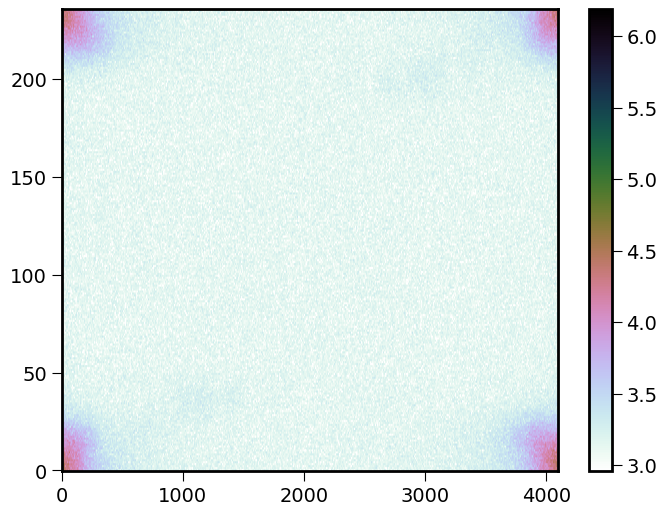

harmonic=13
harmonic=13 rms=1793.0928955078125 log10(rms)=3.2536027431488037 S/N=1.568061351776123


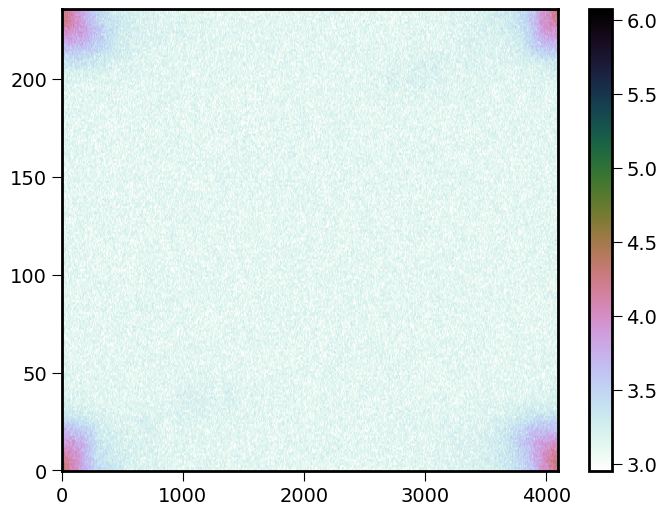

harmonic=14
harmonic=14 rms=1799.947265625 log10(rms)=3.2552597522735596 S/N=1.5288389921188354


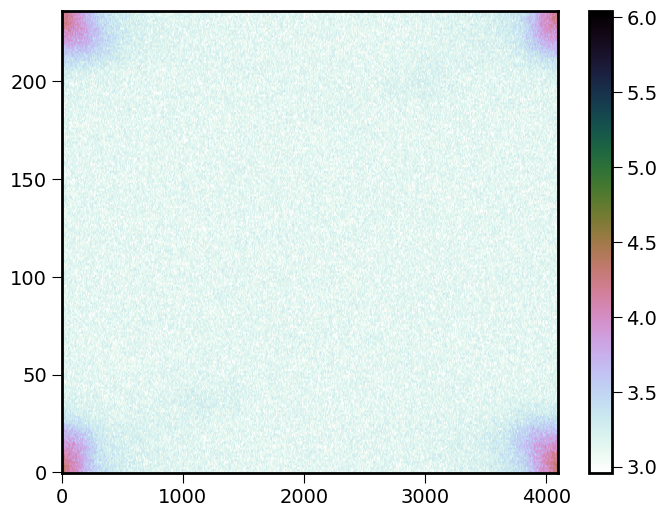

harmonic=15
harmonic=15 rms=1799.2119140625 log10(rms)=3.255082368850708 S/N=1.4472377300262451


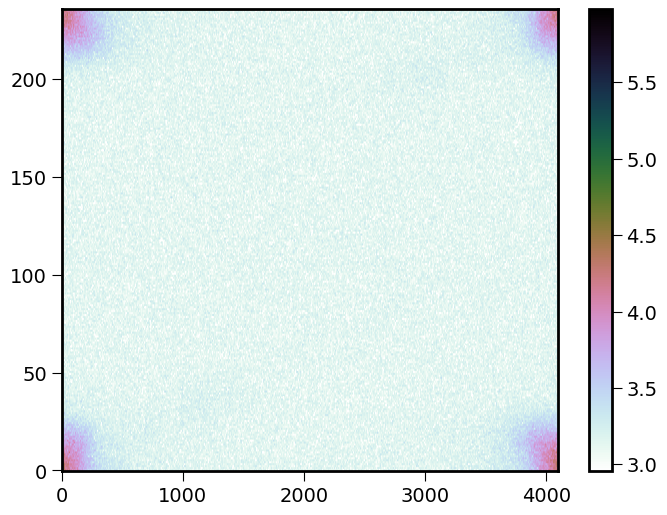

harmonic=16
harmonic=16 rms=1791.005859375 log10(rms)=3.2530970573425293 S/N=1.3255339860916138


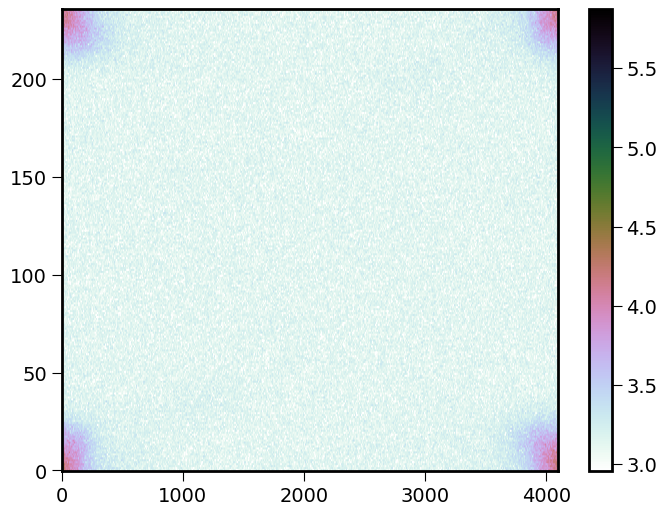

harmonic=17
harmonic=17 rms=1799.1497802734375 log10(rms)=3.2550673484802246 S/N=1.3223272562026978


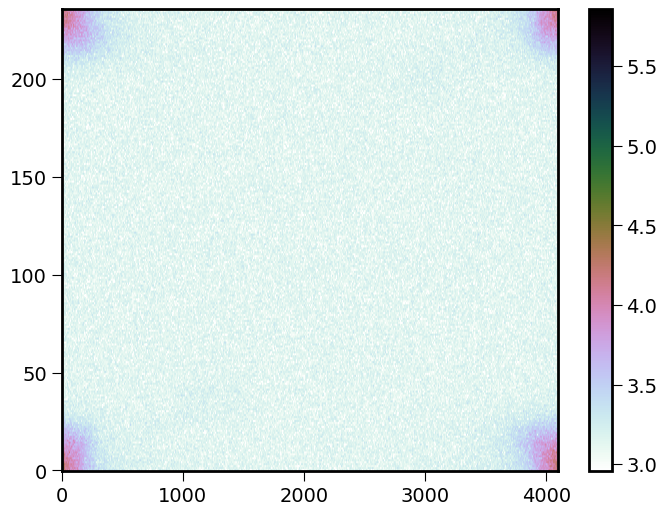

harmonic=18
harmonic=18 rms=1792.796875 log10(rms)=3.253530979156494 S/N=1.1818034648895264


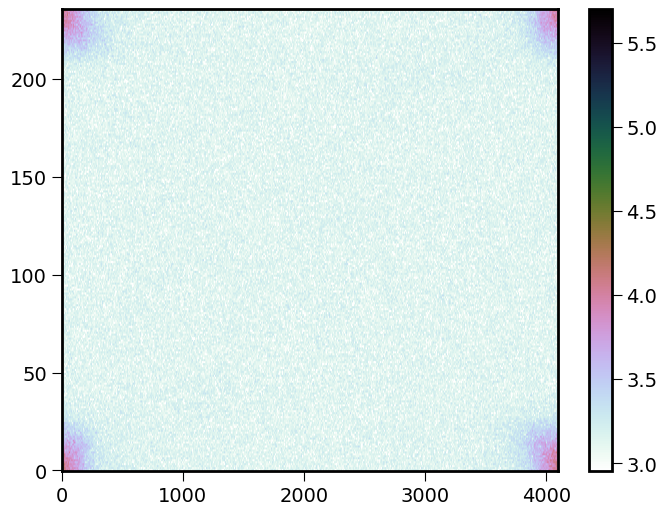

harmonic=19
harmonic=19 rms=1787.3544921875 log10(rms)=3.2522106170654297 S/N=1.2244606018066406


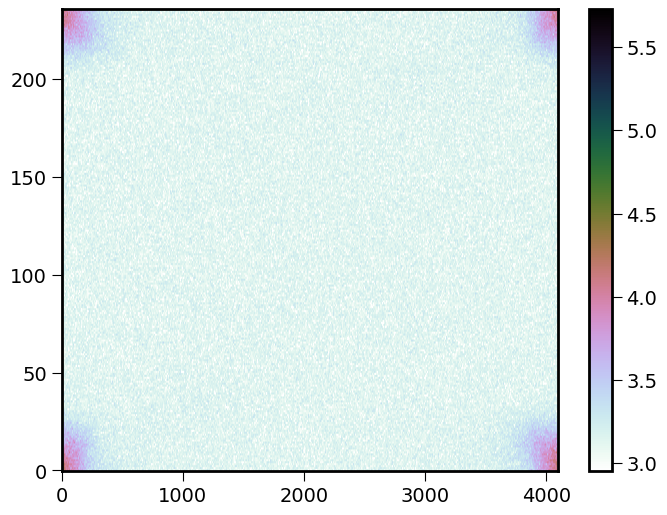

In [4]:
maxharm=np.minimum(20,nharm)
sn = np.zeros(maxharm)

for harm in range(maxharm):
    print(f"harmonic={harm}")
    h_harm=h[:,:,harm]
    power = np.abs(h_harm)**2

    width=10
    min=(nsub-width)//2
    max=(nsub+width)//2
    noise = power[min:max,:]

    variance = np.mean(noise)
    rms = np.sqrt(variance)
    total = np.mean(power)
    sn[harm] = np.sqrt(total/variance)
    print(f'harmonic={harm} rms={rms} log10(rms)={np.log10(rms)} S/N={sn[harm]}')
    
    plotthis = np.log10(np.abs(h_harm))
    plt.imshow(plotthis, aspect="auto", origin="lower", cmap="cubehelix_r", vmin=np.log10(rms/2))
    plt.colorbar()
    plt.show()

In [5]:
### Plot the wavefield power as a function of delay

best harmonic=2


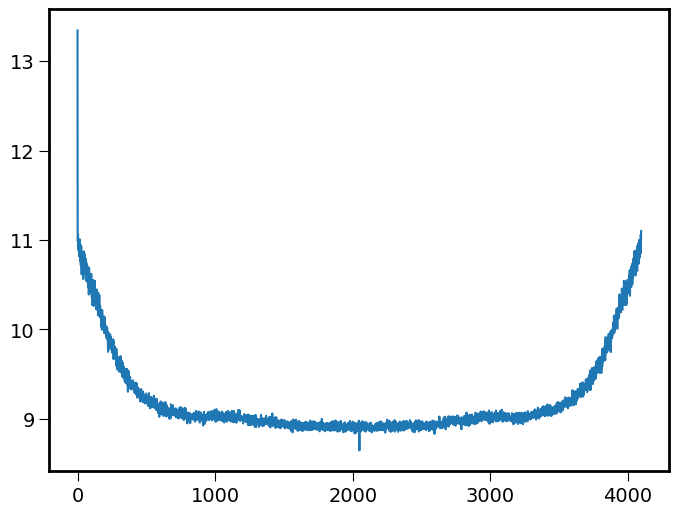

In [6]:
best_harmonic = np.argmax(sn)
print(f"best harmonic={best_harmonic}")

h_harm=h[:,:,best_harmonic]
power = np.abs(h_harm)**2
delay_power = np.sum(power,axis=0)
plt.plot(np.log10(delay_power))